# **Deep Drowsiness Detection using YOLOv11 Model on Custom dataset**

## 1. Collect images dataset

So first of all i use a Python script to automatically click my images for both classes => Awake and Drowsy

I ran it in a seperate Python file called `collect_images.py`, below is the code:

```python
import uuid  # To create Unique identifier for each images we take
import os  # To use filepath to store images
import time  # To get some break between taking images
import cv2

IMAGES_PATH = os.path.join("datas", "new_images")
labels = ["awake", "drowsy"]
number_imgs = 50

cap = cv2.VideoCapture(1)

# Loop through labels
for label in labels:
    print(f"Collecting images for {label}")
    time.sleep(5)

    # Loop through image range
    for img_num in range(number_imgs):
        print(f"Collecting images for {label}, image number {img_num}")

        # Now will access our Webcam, take pictures and save it to our path
        # Webcam feed
        ret, frame = cap.read()

        # Naming our images path
        imgname = os.path.join(IMAGES_PATH, label + "." + str(uuid.uuid1()) + ".jpg")

        # Write out image to file
        cv2.imwrite(imgname, frame)

        # Render to the screen
        cv2.imshow("Image Collection", frame)

        # 5 sec delay between image captures
        time.sleep(2)

        if cv2.waitKey(10) & 0xFF == ord("q"):
            break
cap.release()
cv2.destroyAllWindows()

```

## 2. Annotate dataset

Once i have collected my dataset, i simply uploaded it to Roboflow and quickly Annotated them, i used my old images and new images folder both and annotated them, total image is 213

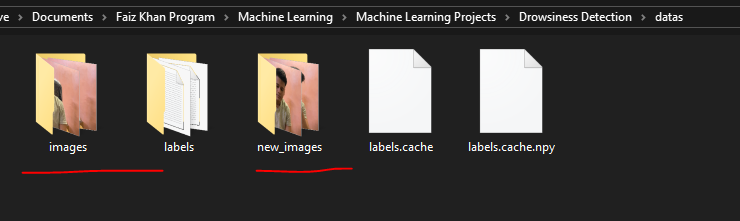


however using roboflow data augmentation, i ended up with around 500+ images

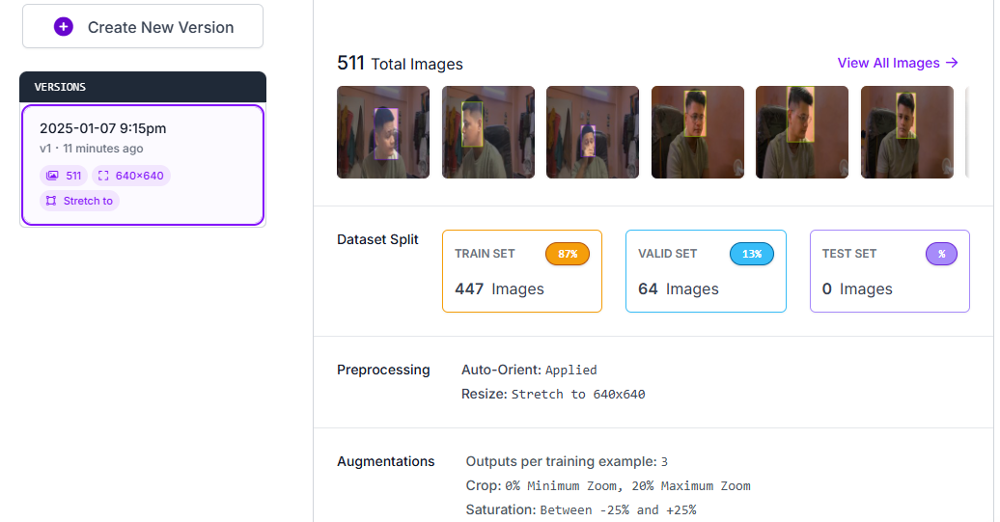



## 3. Import Dependencies

In [3]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [ ]:
!!pip install roboflow

['Collecting roboflow',
 '  Downloading roboflow-1.1.50-py3-none-any.whl.metadata (9.7 kB)',
 'Requirement already satisfied: certifi in /usr/local/lib/python3.10/dist-packages (from roboflow) (2024.12.14)',
 'Collecting idna==3.7 (from roboflow)',
 '  Downloading idna-3.7-py3-none-any.whl.metadata (9.9 kB)',
 'Requirement already satisfied: cycler in /usr/local/lib/python3.10/dist-packages (from roboflow) (0.12.1)',
 'Requirement already satisfied: kiwisolver>=1.3.1 in /usr/local/lib/python3.10/dist-packages (from roboflow) (1.4.7)',
 'Requirement already satisfied: matplotlib in /usr/local/lib/python3.10/dist-packages (from roboflow) (3.8.0)',
 'Requirement already satisfied: numpy>=1.18.5 in /usr/local/lib/python3.10/dist-packages (from roboflow) (1.26.4)',
 'Requirement already satisfied: opencv-python-headless==4.10.0.84 in /usr/local/lib/python3.10/dist-packages (from roboflow) (4.10.0.84)',
 'Requirement already satisfied: Pillow>=7.1.2 in /usr/local/lib/python3.10/dist-packages

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 905.3/905.3 kB 37.2 MB/s eta 0:00:00


## 4. Download and load dataset from Roboflow

Now we can simply download and upload our dataset from Roboflow

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="zcDvqrL4fyQD8VAYAGsa")
project = rf.workspace("mycomputervision").project("drowsiness-detection-dataset")
version = project.version(1)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...


## 5. Instantiating model and Training

Im using the `yolo11m.pt` model which is a medium size one, it performed well and better than i expected

In [4]:
from ultralytics import YOLO

In [ ]:
model = YOLO("yolo11m.pt")

100%|██████████| 38.8M/38.8M [00:00<00:00, 413MB/s]


In [ ]:
model.train(
  data="Drowsiness-Detection-Dataset-1/data.yaml",
  imgsz=640,
  batch=4,
  epochs=50,
  device="cuda", # using CUDA (the whole reason why im running this on Google Collab)
)

Ultralytics 8.3.58 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.pt, data=Drowsiness-Detection-Dataset-1/data.yaml, epochs=50, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tr

100%|██████████| 755k/755k [00:00<00:00, 89.9MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 289MB/s]


AMP: checks passed ✅


train: Scanning /content/Drowsiness-Detection-Dataset-1/train/labels... 447 images, 0 backgrounds, 0 corrupt: 100%|██████████| 447/447 [00:00<00:00, 1968.08it/s]

train: New cache created: /content/Drowsiness-Detection-Dataset-1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.24 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/Drowsiness-Detection-Dataset-1/valid/labels... 64 images, 0 backgrounds, 0 corrupt: 100%|██████████| 64/64 [00:00<00:00, 831.09it/s]

val: New cache created: /content/Drowsiness-Detection-Dataset-1/valid/labels.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       2.7G      1.447      2.044      1.458         10        640: 100%|██████████| 112/112 [00:24<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.51it/s]

                   all         64         64       0.27      0.888      0.277      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       2.6G      1.481      1.583      1.427          9        640: 100%|██████████| 112/112 [00:21<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.10it/s]

                   all         64         64      0.487      0.893      0.579      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.61G      1.496      1.439      1.398          7        640: 100%|██████████| 112/112 [00:22<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  7.19it/s]

                   all         64         64       0.37      0.906       0.43      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.61G      1.443      1.379      1.365          8        640: 100%|██████████| 112/112 [00:21<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.14it/s]

                   all         64         64      0.456      0.991      0.581      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50       2.6G      1.462      1.329       1.37          9        640: 100%|██████████| 112/112 [00:22<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.08it/s]

                   all         64         64      0.389      0.962      0.516      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.59G      1.451      1.322      1.392         11        640: 100%|██████████| 112/112 [00:21<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.14it/s]

                   all         64         64      0.747      0.406      0.467      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.61G      1.348      1.258        1.3          6        640: 100%|██████████| 112/112 [00:23<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.07it/s]

                   all         64         64      0.471          1      0.613      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.61G      1.353      1.279      1.331          6        640: 100%|██████████| 112/112 [00:21<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  7.26it/s]

                   all         64         64      0.349      0.969       0.49      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.61G      1.355      1.228      1.306          6        640: 100%|██████████| 112/112 [00:22<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.24it/s]

                   all         64         64      0.502      0.984      0.721      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.61G      1.275      1.194      1.287          4        640: 100%|██████████| 112/112 [00:21<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.69it/s]

                   all         64         64      0.487          1      0.726      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.61G      1.298      1.169      1.274          8        640: 100%|██████████| 112/112 [00:21<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.21it/s]

                   all         64         64      0.506      0.984      0.693      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50       2.6G      1.273      1.191      1.268          5        640: 100%|██████████| 112/112 [00:22<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.82it/s]

                   all         64         64      0.496          1      0.638      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50       2.6G      1.282      1.174      1.262          6        640: 100%|██████████| 112/112 [00:21<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.12it/s]

                   all         64         64      0.523      0.984      0.769      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50       2.6G      1.273      1.142      1.263          1        640: 100%|██████████| 112/112 [00:23<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.18it/s]

                   all         64         64      0.551      0.984      0.781      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.59G      1.219      1.129      1.253          3        640: 100%|██████████| 112/112 [00:21<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.20it/s]

                   all         64         64      0.536          1      0.748      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.61G      1.216      1.139      1.238          6        640: 100%|██████████| 112/112 [00:22<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.14it/s]

                   all         64         64      0.532       0.92      0.753      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50       2.6G      1.212      1.114      1.233          7        640: 100%|██████████| 112/112 [00:21<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.80it/s]

                   all         64         64      0.584      0.964      0.858      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       2.6G      1.198      1.054      1.236          6        640: 100%|██████████| 112/112 [00:21<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.20it/s]

                   all         64         64      0.673      0.726      0.754      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50       2.6G      1.207      1.082       1.25          4        640: 100%|██████████| 112/112 [00:21<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.62it/s]

                   all         64         64      0.738      0.844      0.835      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50       2.6G      1.236      1.051      1.257          7        640: 100%|██████████| 112/112 [00:21<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.26it/s]

                   all         64         64      0.613      0.961      0.854      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.59G      1.198       1.05      1.227          8        640: 100%|██████████| 112/112 [00:22<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.66it/s]

                   all         64         64      0.581      0.969      0.824      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50       2.6G      1.175      1.058      1.215          5        640: 100%|██████████| 112/112 [00:21<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.18it/s]

                   all         64         64      0.684      0.795      0.801      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50       2.6G      1.139     0.9979      1.203          3        640: 100%|██████████| 112/112 [00:22<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.06it/s]

                   all         64         64      0.665      0.815       0.83      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       2.6G       1.17     0.9896       1.22          7        640: 100%|██████████| 112/112 [00:21<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.22it/s]

                   all         64         64      0.822      0.822      0.839      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.61G      1.172     0.9867      1.211          6        640: 100%|██████████| 112/112 [00:22<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.24it/s]

                   all         64         64      0.731      0.936      0.896      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.59G      1.147     0.9556      1.215          6        640: 100%|██████████| 112/112 [00:21<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.66it/s]

                   all         64         64      0.717      0.922      0.924       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.61G      1.126     0.9678        1.2          6        640: 100%|██████████| 112/112 [00:21<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.14it/s]

                   all         64         64      0.792      0.828      0.928      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       2.6G      1.121     0.9016      1.205          2        640: 100%|██████████| 112/112 [00:22<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.24it/s]

                   all         64         64      0.827       0.83      0.891      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50       2.6G      1.119     0.9438      1.189          5        640: 100%|██████████| 112/112 [00:21<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.05it/s]

                   all         64         64      0.659      0.655      0.836      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50       2.6G      1.102      1.102       1.19          4        640: 100%|██████████| 112/112 [00:23<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  7.60it/s]

                   all         64         64      0.853      0.883      0.925      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50       2.6G      1.066     0.9031      1.158          4        640: 100%|██████████| 112/112 [00:21<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.07it/s]

                   all         64         64       0.78      0.901      0.933      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50       2.6G      1.068     0.8755      1.168          8        640: 100%|██████████| 112/112 [00:23<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.21it/s]

                   all         64         64      0.867      0.891       0.94       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       2.6G      1.037     0.8569      1.133          7        640: 100%|██████████| 112/112 [00:21<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.98it/s]

                   all         64         64      0.924      0.875      0.956      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.59G      1.095     0.8665      1.164          5        640: 100%|██████████| 112/112 [00:22<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.25it/s]

                   all         64         64      0.845      0.952      0.955      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.61G      1.062     0.8817       1.16          6        640: 100%|██████████| 112/112 [00:22<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.52it/s]

                   all         64         64      0.765      0.895      0.905      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       2.6G      1.062     0.8519       1.17          6        640: 100%|██████████| 112/112 [00:21<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.23it/s]

                   all         64         64      0.873       0.91      0.927      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       2.6G       1.07     0.8247      1.159          5        640: 100%|██████████| 112/112 [00:22<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.59it/s]

                   all         64         64      0.929      0.897       0.96      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50       2.6G      1.038     0.8053      1.145         11        640: 100%|██████████| 112/112 [00:21<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.03it/s]

                   all         64         64      0.794      0.922      0.935      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50       2.6G      1.006     0.7825       1.14          6        640: 100%|██████████| 112/112 [00:22<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  7.11it/s]

                   all         64         64      0.915      0.909      0.956       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.59G       1.01     0.7645      1.146          6        640: 100%|██████████| 112/112 [00:21<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.20it/s]

                   all         64         64       0.77      0.914      0.957      0.689


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       2.6G     0.9129     0.5878      1.138          3        640: 100%|██████████| 112/112 [00:23<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.15it/s]

                   all         64         64       0.93       0.83      0.942      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       2.6G     0.9079     0.5643      1.127          3        640: 100%|██████████| 112/112 [00:21<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  7.22it/s]

                   all         64         64      0.787      0.937      0.953      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50       2.6G     0.9303     0.5578      1.137          3        640: 100%|██████████| 112/112 [00:22<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.06it/s]

                   all         64         64      0.851       0.96      0.961      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.61G     0.9094     0.5523      1.119          3        640: 100%|██████████| 112/112 [00:21<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.78it/s]

                   all         64         64      0.899      0.863      0.941      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       2.6G     0.8862     0.5353      1.103          3        640: 100%|██████████| 112/112 [00:21<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.17it/s]

                   all         64         64      0.767      0.922      0.954      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50       2.6G     0.8807     0.5137      1.102          3        640: 100%|██████████| 112/112 [00:22<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  6.71it/s]

                   all         64         64      0.885      0.901      0.932      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50       2.6G     0.8578      0.503      1.092          3        640: 100%|██████████| 112/112 [00:21<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.13it/s]

                   all         64         64      0.829      0.897      0.967      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.59G      0.845     0.4898      1.063          3        640: 100%|██████████| 112/112 [00:22<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  7.44it/s]

                   all         64         64      0.909        0.9      0.967      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.59G     0.8531     0.4745      1.076          3        640: 100%|██████████| 112/112 [00:21<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.24it/s]

                   all         64         64      0.819      0.906      0.973      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.59G      0.833     0.4476       1.08          3        640: 100%|██████████| 112/112 [00:23<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:00<00:00,  8.28it/s]

                   all         64         64      0.886      0.968      0.969       0.69



50 epochs completed in 0.342 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 40.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.58 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11m summary (fused): 303 layers, 20,031,574 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:01<00:00,  5.16it/s]


                   all         64         64       0.82      0.906      0.972      0.693
                 awake         32         32      0.953      0.812      0.972      0.647
                drowsy         32         32      0.686          1      0.973      0.739
Speed: 1.0ms preprocess, 12.5ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e973c56dd50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

## 6. Displaying the Training result

By default, YOLO training curves are stored, we can simply display it using below code

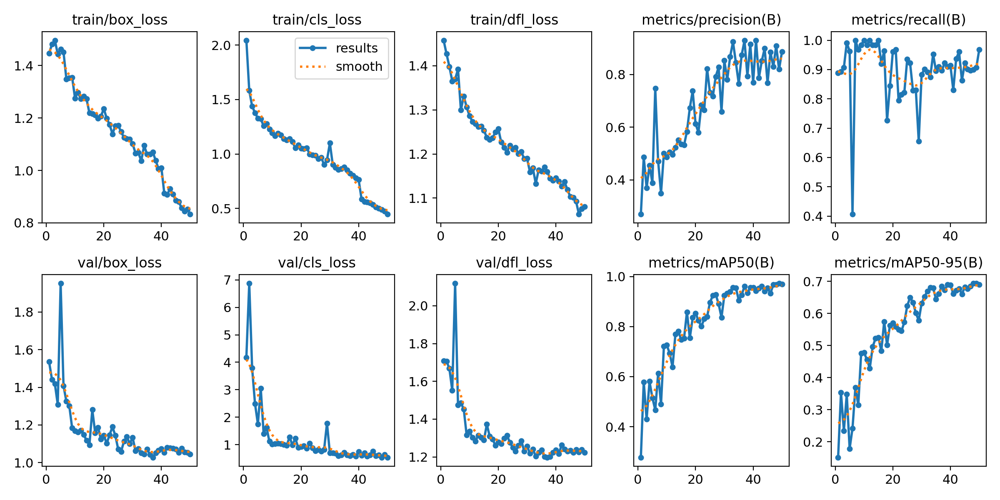

In [23]:
from IPython.display import Image, display

# Path to the results.png
image_path = "/content/runs/detect/train2/results.png"

# Display the image
display(Image(filename=image_path))

Based on the graphs, here’s an analysis of your YOLOv11 model's performance:

1. **Training Losses:**
  *   **Box Loss (train/box_loss):** This decreases steadily, indicating that the model is improving in localizing objects accurately.
  *   **Classification Loss (train/cls_loss):** The steady decline suggests that the model is getting better at classifying objects correctly.
  * **DFL Loss (train/dfl_loss):** A consistent drop implies improvement in predicting the distribution of bounding box coordinates.


2. **Validation Losses:**
  * **Box Loss (val/box_loss) and Classification Loss (val/cls_loss):** These also decrease but with some fluctuation, which is normal. A consistent trend without sharp increases implies generalization is reasonable.
  * **DFL Loss (val/dfl_loss):** The downward trend supports the overall improvement.

3. **Metrics:**
  * **Precision:** It shows an increasing trend, indicating the model is making fewer false-positive predictions over time.
  * **Recall:** The recall metric fluctuates slightly but generally remains high, which means the model is able to detect most objects.
  * **mAP@50 (mean Average Precision at IoU threshold 0.5):** This rises steadily, reaching high values, reflecting good detection performance.
  * **mAP@50-95:** A gradual improvement here suggests that the model performs well across a range of IoU thresholds, indicating robust overall performance.

**Overall Assessment:**

Our model appears to be performing well. The decreasing losses and increasing metrics (especially mAP) are signs of effective training. However, fluctuations in recall and validation losses may indicate slight overfitting or variability in our validation data

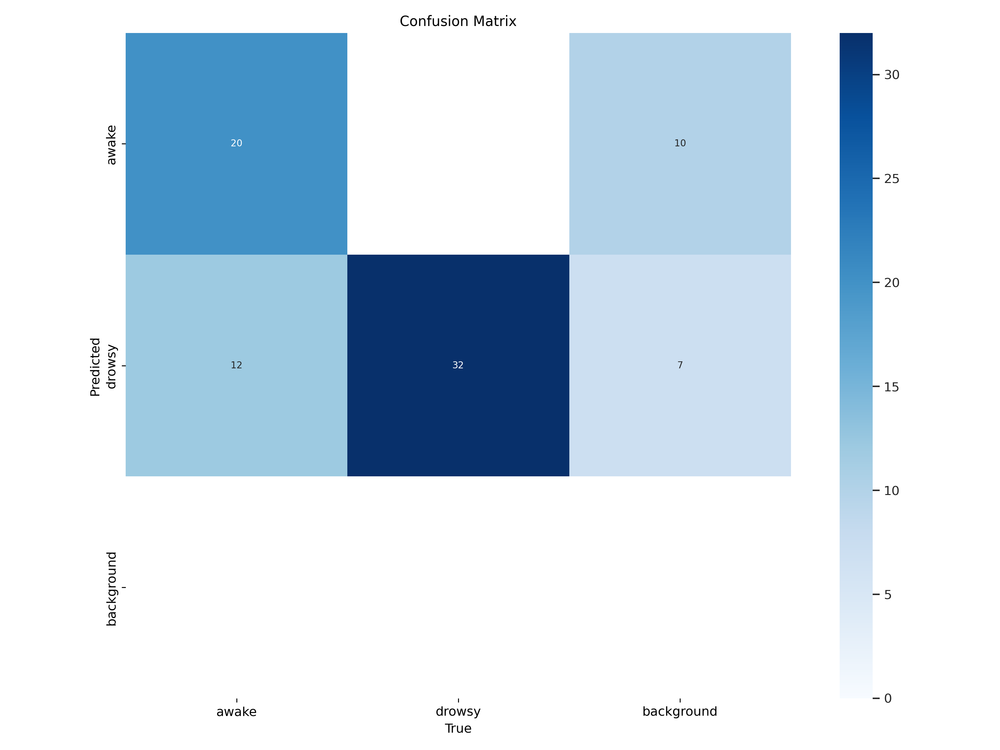

In [24]:
display(Image(filename="/content/runs/detect/train2/confusion_matrix.png"))

This is a confusion matrix that evaluates the performance of a classification model. Each cell in the matrix provides information about the number of instances where the model made correct or incorrect predictions for specific classes

* The model correctly identifies 20 samples as "Awake," but misclassifies 11 as "Drowsy." This shows decent performance for the "Awake" class but with some confusion with "Drowsy."
* The model performs well here, correctly identifying 32 samples as "Drowsy." However, it misclassifies 12 "Drowsy" samples as "Awake" and 6 as "Background," indicating room for improvement in reducing these errors.
* I have no idea where did the background class even come from when i have only either "Awake" or "Drowsy"

## 7. Detections on images

Lets try the trained model now!

We can do detections on images, but since im working on Google Collab, i dont have image to test one, so i need to upload an image from my local drive to here, for that we can use the `files` method from `google.collab`

In [ ]:
from google.colab import files

uploaded = files.upload()  # This will open a file dialog for you to upload your image

Saving awake.01c99758-cd06-11ef-b28b-b4b68627882c.jpg to awake.01c99758-cd06-11ef-b28b-b4b68627882c.jpg


Now we can simply do prediction on the image

In [ ]:
predict = model.predict(source="test_img1.jpg", save=True)


image 1/1 /content/test_img1.jpg: 384x640 2 awakes, 2 drowsys, 75.1ms
Speed: 2.7ms preprocess, 75.1ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/train22


We can also display the image out as below

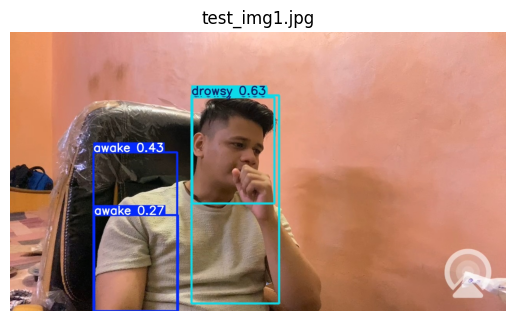

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Ensure inline display in Jupyter Notebook
%matplotlib inline

output_path = predict[0].save_dir

# Loop through all images in the directory and display them
for file_name in os.listdir(output_path):
  if file_name.endswith((".jpg", ".png")): # Check for image files
    img_path = os.path.join(output_path, file_name)
    img = Image.open(img_path)
    # Display the image
    plt.figure() # Create a new figure for each image
    plt.imshow(img)
    plt.axis('off') # Hide axes for better visualization
    plt.title(file_name) # Display the file name as the title
    plt.show()

Well it did detect the "drowsy" correctly, however it detected some unnecessary things as well, i believe if we train longer and tweak some parameters such as setting the confidence score treshold higher, then it do be fine, for now this is good enough!

Lets detect on another image


image 1/1 /content/test_img2.jpg: 384x640 1 drowsy, 24.3ms
Speed: 2.4ms preprocess, 24.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/train23


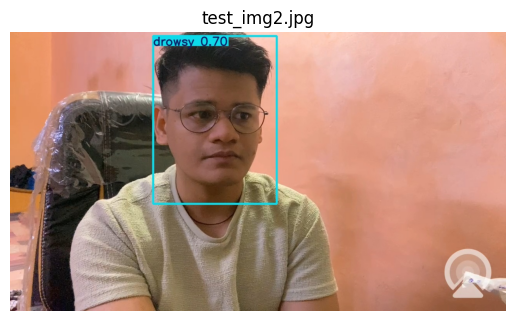

In [ ]:
predict = model.predict(source="test_img2.jpg", save=True)

output_path = predict[0].save_dir


for file_name in os.listdir(output_path):
  if file_name.endswith((".jpg", ".png")):
    img_path = os.path.join(output_path, file_name)
    img = Image.open(img_path)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.title(file_name)
    plt.show()

## 8. Detections on validation dataset

Now lets try to detect on all the images in Validation dataset (I should have included test dataset during train test split in Roboflow, but oh well, we will just use the validation set).

We can simply provide the folder name or path to detect on bunch of images as below

In [ ]:
predict = model.predict(source="/content/Drowsiness-Detection-Dataset-1/valid/images", save=True)


image 1/64 /content/Drowsiness-Detection-Dataset-1/valid/images/awake-044750a7-cd06-11ef-a5e8-b4b68627882c_jpg.rf.daed0ed9422b0d459d8553c1425ffa16.jpg: 640x640 1 drowsy, 58.9ms
image 2/64 /content/Drowsiness-Detection-Dataset-1/valid/images/awake-06c3a081-cd06-11ef-9843-b4b68627882c_jpg.rf.2955ec285c2d0574bd53074687abec6f.jpg: 640x640 1 awake, 1 drowsy, 53.2ms
image 3/64 /content/Drowsiness-Detection-Dataset-1/valid/images/awake-093d0f6d-cd06-11ef-b5c9-b4b68627882c_jpg.rf.d3f63e085aa0528f62de5d87e7b1aab9.jpg: 640x640 1 awake, 1 drowsy, 123.1ms
image 4/64 /content/Drowsiness-Detection-Dataset-1/valid/images/awake-10b7e407-cd06-11ef-8521-b4b68627882c_jpg.rf.72fe2339f956d60917ee1af7cdc6d0bf.jpg: 640x640 1 awake, 1 drowsy, 103.4ms
image 5/64 /content/Drowsiness-Detection-Dataset-1/valid/images/awake-11f484be-cd06-11ef-83c8-b4b68627882c_jpg.rf.b4ef111bc4458c9f387ebac98c28269b.jpg: 640x640 1 awake, 113.5ms
image 6/64 /content/Drowsiness-Detection-Dataset-1/valid/images/awake-13356af8-cd06-1

Now we can loop through and display all the detected images

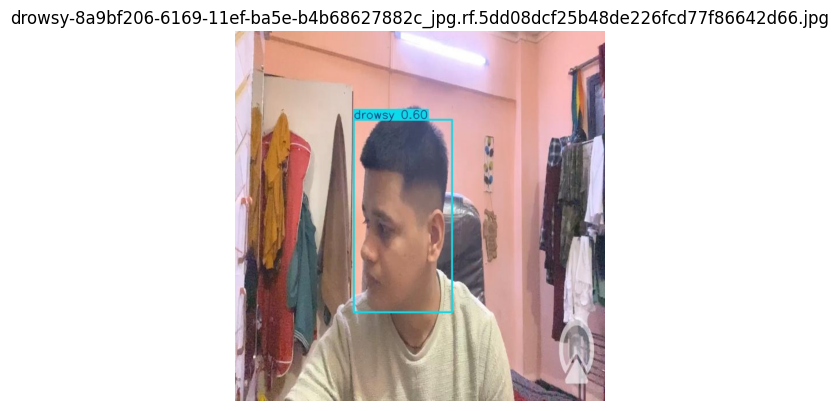

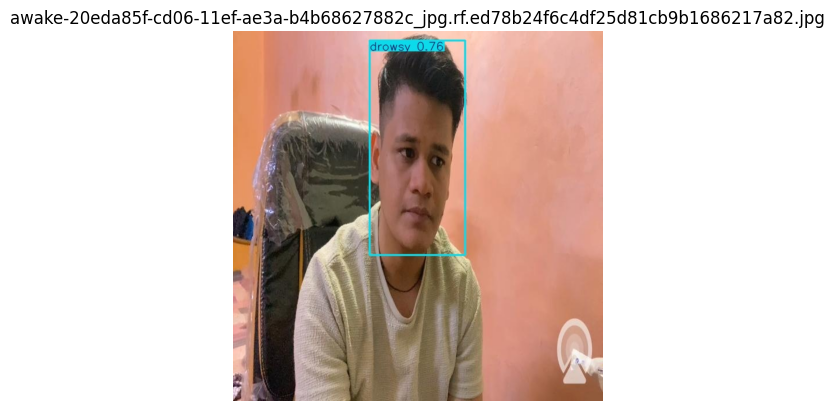

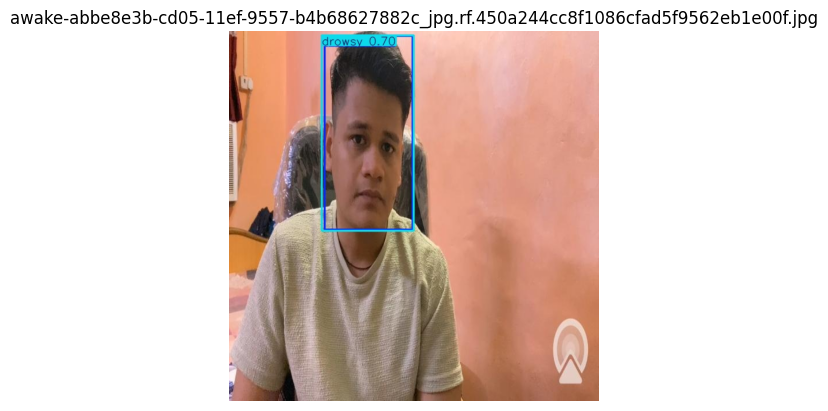

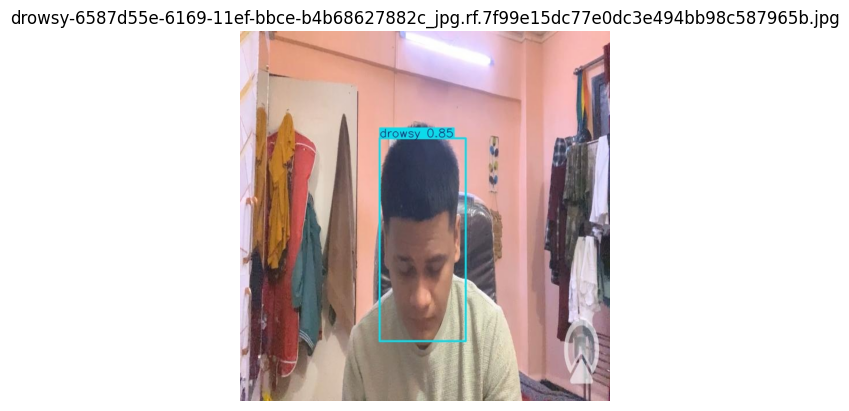

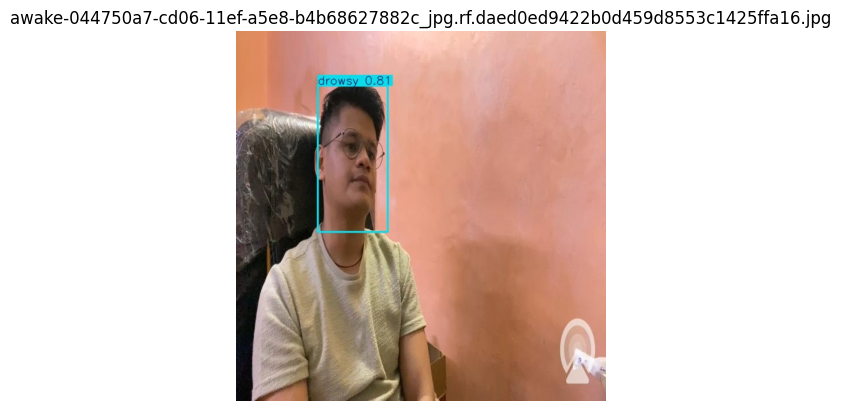

...

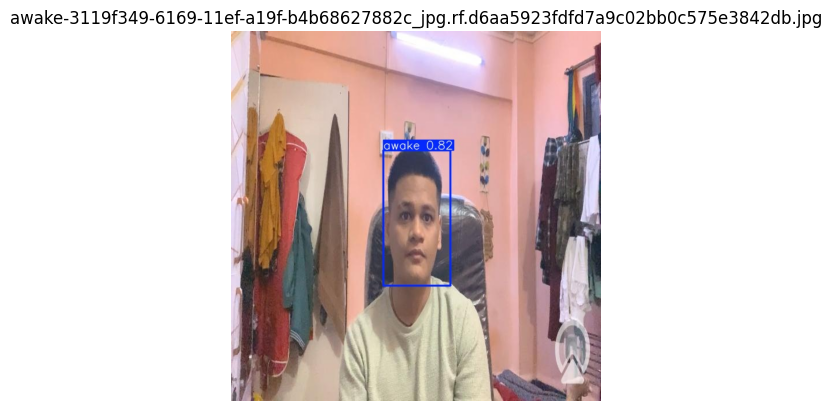

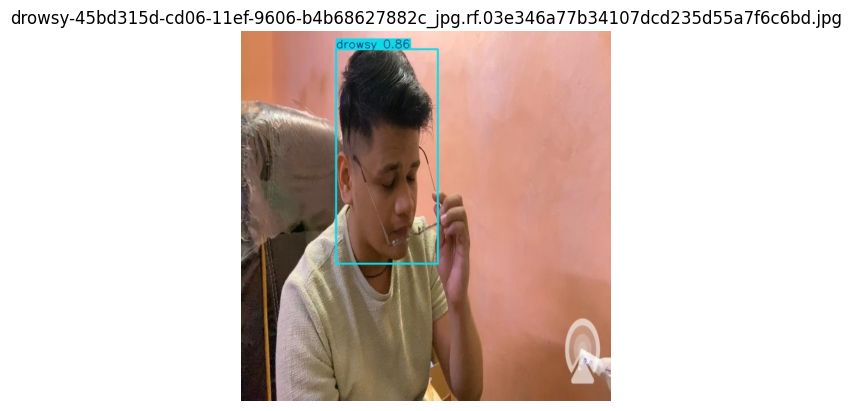

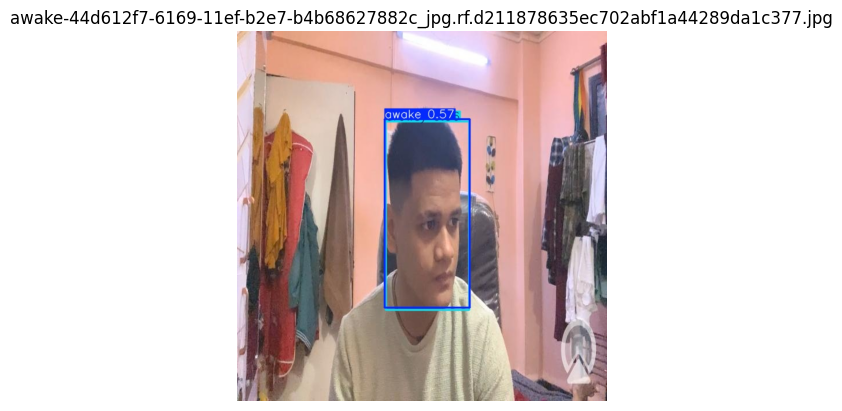

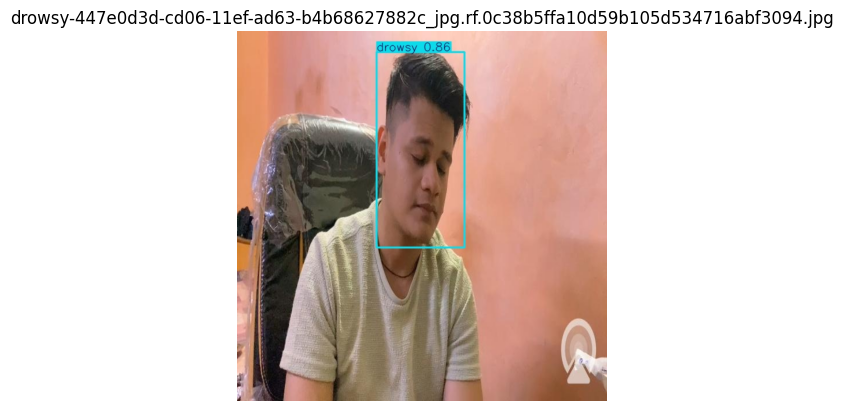

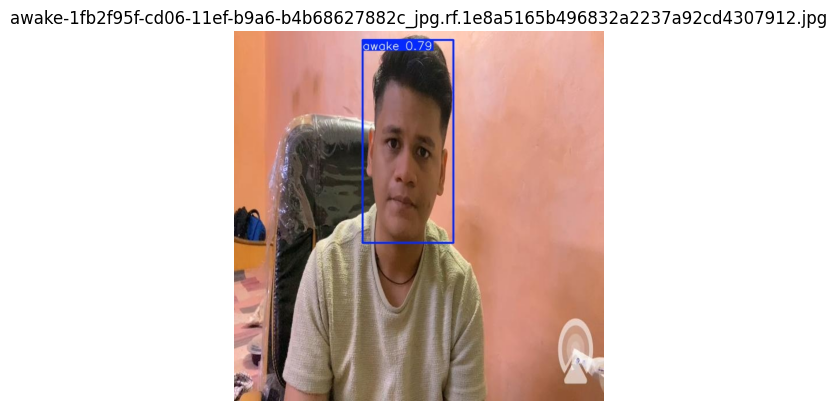

In [ ]:
output_path = predict[0].save_dir

for file_name in os.listdir(output_path):
  if file_name.endswith((".jpg", ".png")):
    img_path = os.path.join(output_path, file_name)
    img = Image.open(img_path)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.title(file_name)
    plt.show()

## 9. Evaluation

We can evaluate our model as below, this will give us all the metrics

In [20]:
results = model.val(data="/content/Drowsiness-Detection-Dataset-1/data.yaml", imgsz=640)

Ultralytics 8.3.58 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/Drowsiness-Detection-Dataset-1/valid/labels.cache... 64 images, 0 backgrounds, 0 corrupt: 100%|██████████| 64/64 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:02<00:00,  7.00it/s]


                   all         64         64      0.819      0.906      0.972      0.693
                 awake         32         32      0.952      0.812      0.972       0.65
                drowsy         32         32      0.687          1      0.972      0.736
Speed: 0.4ms preprocess, 27.7ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/train26


Let’s break down the metrics from our validation results to help understand and evaluate our model's performance.

**Key Metrics Interpretation:**
1. **mAP@50 (Mean Average Precision at IoU=0.5)**
  * Value: 0.972
  * This is a key metric for object detection, indicating how well the predicted bounding boxes overlap with ground truth, with a threshold of 50% IoU (Intersection over Union). A high value (close to 1.0) suggests the model is detecting objects with good overlap. our mAP@50 is excellent (97.2%).
2. **mAP@50-95**
  * Value: 0.693
  * This is a stricter and more comprehensive metric, averaging mAP over IoU thresholds from 0.5 to 0.95 in steps of 0.05. This value is lower (69.3%) because it reflects performance under stricter IoU thresholds. It indicates that while the model performs well at lower thresholds, performance declines under stricter overlap requirements.
3. **Class-wise Precision (Box(P))**
  * awake: 0.952
  * drowsy: 0.687
  * Precision measures the proportion of correctly predicted bounding boxes out of all predicted boxes. Your model has high precision for the "awake" class but lower precision for the "drowsy" class, suggesting more false positives for "drowsy."
4. **Class-wise Recall (R)**
  * awake: 0.812
  * drowsy: 1.0
  * Recall measures the proportion of ground truth objects correctly detected. The model perfectly detects all "drowsy" instances but misses some "awake" instances.
5. **Speed**
  * Preprocessing: 0.4ms
  * Inference: 27.7ms (time to run the model on an image)
  * Postprocessing: 1.4ms
  * These values indicate that your model is relatively fast, especially for inference, which is important for real-time applications.


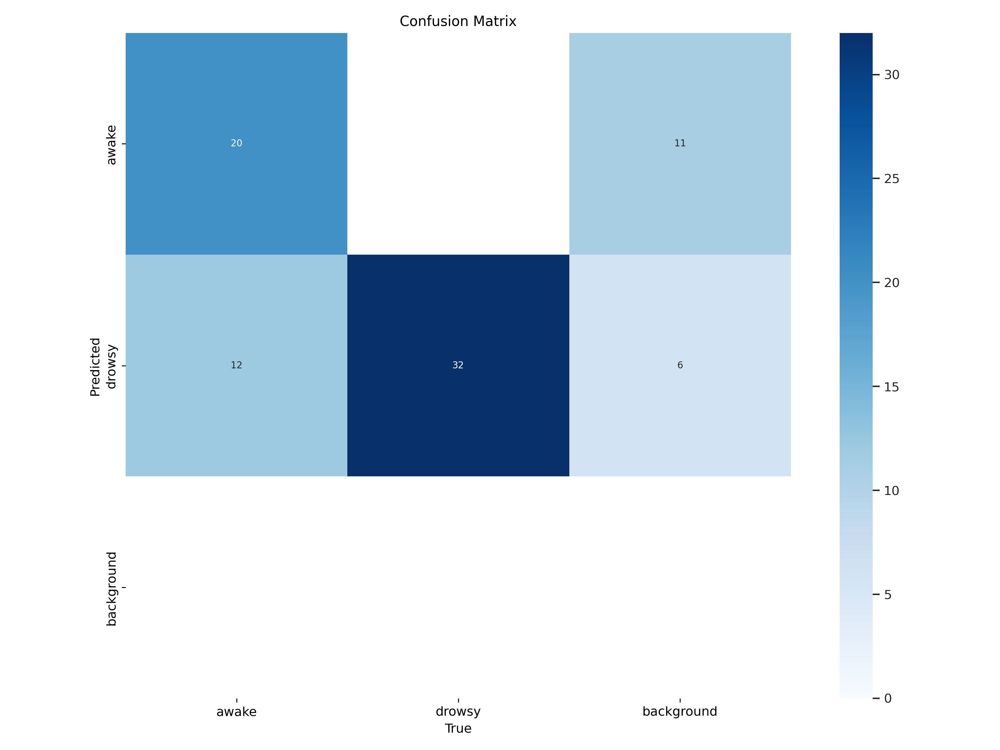

In [25]:
display(Image(filename="/content/runs/detect/train26/confusion_matrix.png"))

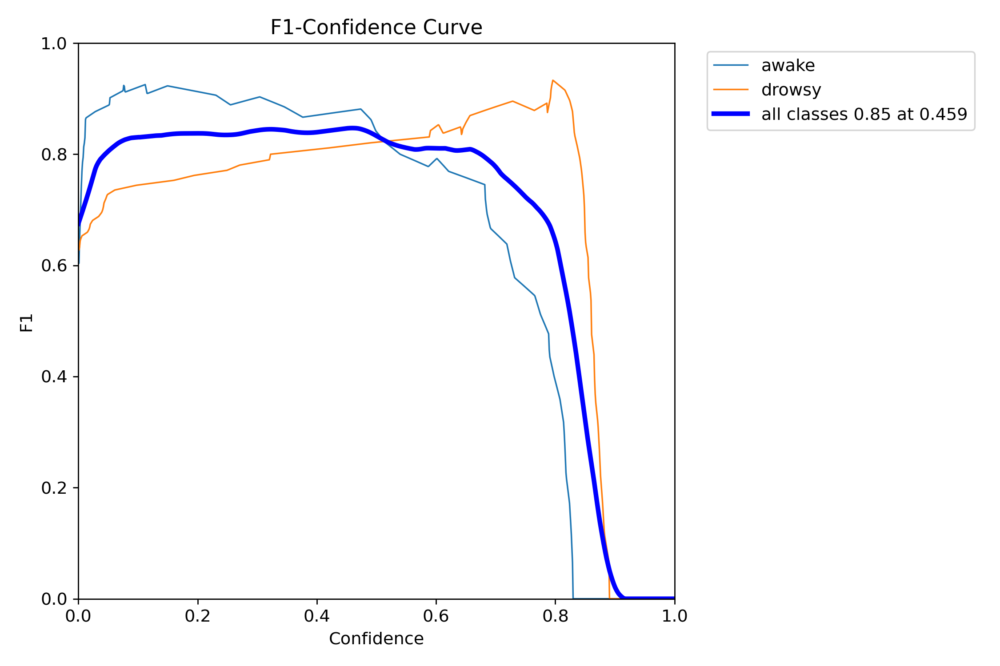

In [30]:
display(Image(filename="/content/runs/detect/train26/F1_curve.png"))

## 10. Detections on Videos

Now we can also do detection on videos similarly, just provide the name or path

In [8]:
from google.colab import files
uploaded = files.upload()  # This will open a file dialog for you to upload your image

Saving test-vid2.mp4 to test-vid2.mp4


Also, i will load the `best.pt` model since i had to reload this notebook, i have also downloaded the `best.pt`

In [5]:
model = YOLO("/content/runs/detect/train2/weights/best.pt")

Now lets do predictions

In [10]:
predict = model.predict(source="/content/test-vid2.mp4", save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/140) /content/test-vid2.mp4: 352x640 1 drowsy, 391.0ms
video 1/1 (frame 2/140) /content/test-vid2.mp4: 352x640 (no detections), 23.9ms
video 1/1 (frame 3/140) /content/test-vid2.mp4: 352x640 1 drowsy, 29.4ms
video 1/1 (frame 4/140) /content/test-vid2.mp4: 352x640 1 drowsy, 23.9ms
video 1/1 (frame 5/140) /content/test-vid2.mp4: 352x640 1 drowsy, 23.8ms
video 1/1 (frame 6/140) /content/test-vid2.mp4: 352x640 1 drowsy, 23.8ms
video 1/1 

Well if you go check the video on `runs/detect/predict` you would see it detected the drowsiness perfectly wit high Confidence score

Now lets do on an Awake video

In [13]:
uploaded = files.upload()

Saving 7792311-hd_1920_1080_25fps.mp4 to 7792311-hd_1920_1080_25fps.mp4


In [14]:
predict = model.predict(source="/content/test-vid4.mp4", save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/195) /content/test-vid4.mp4: 384x640 (no detections), 24.2ms
video 1/1 (frame 2/195) /content/test-vid4.mp4: 384x640 1 awake, 24.1ms
video 1/1 (frame 3/195) /content/test-vid4.mp4: 384x640 1 awake, 24.1ms
video 1/1 (frame 4/195) /content/test-vid4.mp4: 384x640 (no detections), 24.1ms
video 1/1 (frame 5/195) /content/test-vid4.mp4: 384x640 (no detections), 24.1ms
video 1/1 (frame 6/195) /content/test-vid4.mp4: 384x640 1 awake, 24.1ms


It did detect it as well, Now i want to test the model on Live webcam as well but since im using Google collab, i cant, so i simply saved the `best.pt` model and will run it locally.

For now, thats it!